# Feb 18, 2025: compare inferred communities with known systems 
resting state networks (RSNs), and their sub-networks (independent components (ICs)).

In [62]:
import csv
import os
import sys
import numpy as np
import pandas as pd
import scipy as sp 
import dill as pickle 
from os.path import join as pjoin
from itertools import product
from tqdm import tqdm
from copy import deepcopy
from pathlib import Path
import subprocess
from scipy import sparse, stats, linalg
from scipy.spatial.distance import jensenshannon, cosine
from scipy.stats import wilcoxon
from multiprocessing import Pool
import glob
import random
from joblib import Parallel, delayed
import re
from sklearn.utils import resample


from sklearn.cluster import DBSCAN, SpectralCoclustering, SpectralClustering
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import pdist, squareform

import arviz as az

import ants
from nipype.interfaces import afni

from itertools import product, combinations, chain
import multiprocessing as mp
from functools import partial

# networks
import graph_tool.all as gt
import networkx as nx

# plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from cycler import cycler
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cm import rainbow

plt.rcParamsDefault['font.family'] = "sans-serif"
plt.rcParamsDefault['font.sans-serif'] = "Arial"
plt.rcParams['font.size'] = 14
plt.rcParams["errorbar.capsize"] = 0.5

import cmasher as cmr  # CITE ITS PAPER IN YOUR MANUSCRIPT
import colorcet as cc

# ignore user warnings
import warnings
warnings.filterwarnings("ignore") #, category=UserWarning)

In [2]:
def get_colorblind_palette(n=20):
    """Return a merged, deduplicated colorblind-safe palette from CUD, Seaborn, and extended sources."""
    base = [
        "#0072B2", "#D55E00", "#009E73", "#CC79A7",
        "#F0E442", "#56B4E9", "#E69F00", "#000000",
        "#999999", "#882255", "#44AA99", "#117733"
    ]
    
    new = [
        "#0173B2", "#DE8F05", "#029E73", "#D55E00",  # D55E00 already in base
        "#CC78BC", "#CA9161", "#FBAFE4", "#949494",
        "#ECE133", "#56B4E9"  # 56B4E9 already in base
    ]
    
    # Deduplicate while preserving order
    seen = set()
    full = base + new
    merged = []
    for color in full:
        if color.lower() not in seen:
            merged.append(color)
            seen.add(color.lower())
    
    return merged[:n]

def setup_mpl(fontsize=7):
    """Configure matplotlib for Illustrator export with Helvetica-style fonts and clean styles."""
    
    CUD_COLORS = get_colorblind_palette()
    
    mpl.rcParams.update({
        # Fonts and layout
        "font.family": "sans-serif",
        "font.sans-serif": ["Arial", "DejaVu Sans"],
        "font.size": fontsize,
        "axes.titlesize": fontsize,
        "axes.labelsize": fontsize,
        "xtick.labelsize": fontsize,
        "ytick.labelsize": fontsize,
        "legend.fontsize": fontsize,

        # Export settings
        "svg.fonttype": 'none',
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
        "figure.dpi": 300,
        "savefig.dpi": 300,
        "text.usetex": False,

        # Axes and ticks
        "axes.linewidth": 0.5,
        "xtick.major.width": 0.5,
        "ytick.major.width": 0.5,
        "xtick.minor.width": 0.5,
        "ytick.minor.width": 0.5,
        "xtick.major.size": 2.5,
        "ytick.major.size": 2.5,

        # Lines
        "lines.linewidth": 1.0,

        # Default color cycle (Color Universal Design)
        "axes.prop_cycle": cycler('color', CUD_COLORS),
    })

    # mpl.rcParams["axes.prop_cycle"] = cycler('color', get_colorblind_palette())

In [3]:
setup_mpl(fontsize=7)
CUD_COLORS = get_colorblind_palette()

In [4]:
class ARGS():
    pass

args = ARGS()

args.SEED = 100

def set_seed(args):
    gt.seed_rng(args.SEED)
    np.random.seed(args.SEED)

set_seed(args)

In [5]:
args.source = 'allen'
args.space = 'ccfv2'
args.brain_div = 'whl'
args.num_rois = 172
args.resolution = 200

PARC_DESC = (
    f'source-{args.source}'
    f'_space-{args.space}'
    f'_braindiv-{args.brain_div}'
    f'_nrois-{args.num_rois}'
    f'_res-{args.resolution}'
)
PARC_DESC

'source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200'

In [6]:
args.GRAPH_DEF = f'constructed'
args.GRAPH_METHOD = f'pearson'
args.THRESHOLD = f'signed'
args.EDGE_DEF = f'binary'
args.EDGE_DENSITY = 20
args.LAYER_DEF = f'individual'
args.DATA_UNIT = f'sub'

BASE_path = f'{os.environ["HOME"]}/new_mouse_dataset'
PARCELS_path = f'{BASE_path}/parcels'
ROI_path = (
    f'{BASE_path}/roi-results-v3'
    f'/{PARC_DESC}'
)
ROI_SYS_path = f'{ROI_path}/canonical-systems/joanes'
os.system(f'mkdir -p {ROI_SYS_path}')
TS_path = f'{ROI_path}/roi_timeseries'
ROI_RESULTS_path = (
    f'{ROI_path}'
    f'/graph-{args.GRAPH_DEF}/method-{args.GRAPH_METHOD}'
    f'/threshold-{args.THRESHOLD}/edge-{args.EDGE_DEF}/density-{args.EDGE_DENSITY}'
    f'/layer-{args.LAYER_DEF}/unit-{args.DATA_UNIT}'
)
GRAPH_path = f'{ROI_RESULTS_path}/graphs'
os.system(f'mkdir -p {GRAPH_path}')
SBM_path = f'{ROI_RESULTS_path}/model-fits'
os.system(f'mkdir -p {SBM_path}')
DIAG_path = f'{ROI_RESULTS_path}/diagnostics'
os.system(f'mkdir -p {DIAG_path}')
ESTIM_path = f'{ROI_RESULTS_path}/estimates'
os.system(f'mkdir -p {ESTIM_path}/individual')
os.system(f'mkdir -p {ESTIM_path}/group')

0

In [7]:
# relevant comms for plotting
if PARC_DESC == 'source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200':
    args.relevant_comms = np.arange(0, 25)

In [8]:
def get_sys_vols(ic_files):
    ic_vols = []
    for ic_file in tqdm(ic_files):
        ic = int(os.path.basename(ic_file)[12:14])
        ic_vol = ants.image_read(ic_file).numpy()
        ic_vols.append(ic_vol)
        # break
    ic_vols = np.stack(ic_vols, axis=-1)
    print(ic_vols.shape)
    return ic_vols

In [9]:
ic_files = sorted(glob.glob(f'{ROI_SYS_path}/ics/both/*desc-*.nii.gz', recursive=True))
ics_df = pd.read_csv(f'{ROI_SYS_path}/desc-ic-names.csv')
ic_vols = get_sys_vols(ic_files)
ic_files

lic_files = sorted(glob.glob(f'{ROI_SYS_path}/ics/left/*desc-*.nii.gz', recursive=True))
l_ics_df = pd.read_csv(f'{ROI_SYS_path}/desc-lic-names.csv')
lic_vols = get_sys_vols(lic_files)
lic_files

ric_files = sorted(glob.glob(f'{ROI_SYS_path}/ics/right/*desc-*.nii.gz', recursive=True))
r_ics_df = pd.read_csv(f'{ROI_SYS_path}/desc-ric-names.csv')
ric_vols = get_sys_vols(ric_files)
ric_files

  0%|          | 0/18 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:00<00:00, 285.99it/s]


(57, 40, 66, 18)


100%|██████████| 18/18 [00:00<00:00, 312.50it/s]


(57, 40, 66, 18)


100%|██████████| 18/18 [00:00<00:00, 301.00it/s]

(57, 40, 66, 18)


['/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-00.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-01.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-02.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-03.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-04.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/ics/right/hemi-R_desc-05.nii.gz',
 '/home/go

In [10]:
rsn_files = sorted(glob.glob(f'{ROI_SYS_path}/rsns/both/*desc-*.nii.gz', recursive=True))
rsns_df = pd.read_csv(f'{ROI_SYS_path}/desc-rsn-names.csv')
rsn_files

['/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/rsns/both/hemi-B_desc-00.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/rsns/both/hemi-B_desc-01.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/rsns/both/hemi-B_desc-02.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/rsns/both/hemi-B_desc-03.nii.gz',
 '/home/govindas/new_mouse_dataset/roi-results-v3/source-allen_space-ccfv2_braindiv-whl_nrois-172_res-200/canonical-systems/joanes/rsns/both/hemi-B_desc-04.nii.gz']

In [11]:
rsns_df

,Unnamed: 0,rsn,name,ics
0,0,4,basal ganglia,"[13, 12, 14]"
1,1,3,limbic,"[9, 8, 10, 11, 15, 16]"
2,2,2,olfactory,"[0, 17]"
3,3,1,sensory,"[1, 6, 7]"
4,4,0,somatosensory,"[2, 3, 4, 5]"


In [12]:
rsn_vols = get_sys_vols(rsn_files)

100%|██████████| 5/5 [00:00<00:00, 161.64it/s]

(57, 40, 66, 5)


In [13]:
parcels_img = ants.image_read(f'{PARCELS_path}/{PARC_DESC}_desc-parcels.nii.gz')
parcels_vol = parcels_img.numpy()
parcels_vol = np.round(parcels_vol, decimals=0)
roi_labels = pd.read_csv(f'{PARCELS_path}/{PARC_DESC}_desc-names.csv')['roi'].to_numpy()

In [14]:
args.dc, args.sbm = False, 'h'

args.nested = True if args.sbm in ['h'] else False

args.force_niter = 40000
args.num_draws = int((1/2) * args.force_niter)

def sbm_name(args):
    dc = f'dc' if args.dc else f'nd'
    dc = f'' if args.sbm in ['m', 'a'] else dc
    file = f'sbm-{dc}-{args.sbm}'
    return file

SBM = sbm_name(args)
SBM

'sbm-nd-h'

---

In [15]:
marginals_files = sorted(glob.glob(f'{ESTIM_path}/individual/sub-*/partition-modes-group-aligned/{SBM}/desc-mem-mats.pkl', recursive=True))
marginals_df = []
for sbm_file in marginals_files:
    with open(f'{sbm_file}', 'rb') as f:
        row = pickle.load(f)
    marginals_df += [row]
marginals_df = pd.concat(marginals_df).reset_index(drop=True)
mode_ids = list(chain.from_iterable([list(range(count)) for count in marginals_df['sub'].value_counts().sort_index().to_list()]))
marginals_df['mode_id'] = mode_ids

marginals_df

,sub,sbm,pi_0_aligned,pi_1_aligned,pi_2_aligned,pi_3_aligned,pi_4_aligned,pi_5_aligned,pi_6_aligned,pi_7_aligned,pi_8_aligned,omega,mode_id
0,SLC01,sbm-nd-h,"[[0.9943502824858758, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.9082639088384565, 0.005617798206134892, 0....","[[0.8850912125784436, 0.09756830776993501, 0.0...","[[0.9881457547053836, 0.011854245294616511], [...","[[0.9952583018821535, 0.004741698117846605], [...","[[0.9976291509410767, 0.0023708490589233024], ...","[[0.9976291509410767, 0.0023708490589233024], ...","[[0.9976291509410767, 0.0023708490589233024], ...","[[1.0], [1.0], [1.0000000000000002], [1.0], [0...",0.177295,0
1,SLC01,sbm-nd-h,"[[0.9924242424242424, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.9305555555555556, 0.0, 0.00751836547291092...","[[0.8583704854173055, 0.11905640763280642, 0.0...","[[0.9686317578785476, 0.03136824212145242], [0...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...",0.132086,1
2,SLC01,sbm-nd-h,"[[0.9672131147540983, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.9002956194571352, 0.0, 0.00792797635044343...","[[0.8373335842458809, 0.11451218593710696, 0.0...","[[0.9879460856908309, 0.012053914309169156], [...","[[1.0], [0.9999999999999999], [0.9999999999999...","[[1.0], [0.9999999999999999], [0.9999999999999...","[[1.0], [0.9999999999999999], [0.9999999999999...","[[1.0], [0.9999999999999999], [0.9999999999999...","[[1.0], [0.9999999999999999], [0.9999999999999...",0.122464,2
3,SLC01,sbm-nd-h,"[[0.989247311827957, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[0.9813851312290439, 0.0, 0.00011562030292519...","[[0.9137888107775382, 0.06490505861861601, 0.0...","[[0.9885271006993847, 0.011472899300615397], [...","[[0.997705420139877, 0.0022945798601230792], [...","[[1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1....","[[1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1....","[[1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1....","[[1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1....",0.093199,3
4,SLC01,sbm-nd-h,"[[0.44565217391304346, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.9117334697438667, 0.028759166164648204, 0....","[[0.9033271327908874, 0.095322184980498, 0.000...","[[0.9909216966685239, 0.009078303331476], [0.9...","[[0.995460848334262, 0.004539151665738], [0.99...","[[0.995460848334262, 0.004539151665738], [0.99...","[[1.0], [1.0000000000000002], [1.0], [1.000000...","[[1.0], [1.0000000000000002], [1.0], [1.000000...","[[1.0], [1.0000000000000002], [1.0], [1.000000...",0.091858,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.02105398883751773, 0.00040523863029342963,...","[[0.9629751425533718, 0.0367510004382298, 0.00...","[[0.9914532557120393, 0.008546744287960418], [...","[[0.9982906511424077, 0.0017093488575920836], ...","[[0.9999999999999998], [1.0], [1.0], [1.0], [1...","[[0.9999999999999998], [1.0], [1.0], [1.0], [1...","[[0.9999999999999998], [1.0], [1.0], [1.0], [1...","[[0.9999999999999998], [1.0], [1.0], [1.0], [1...",0.233420,1
81,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.9869606077218264,...","[[0.9629514024881322, 0.037048597511867884, 0....","[[0.9919459570626374, 0.008054042937362584], [...","[[0.9991945957062638, 0.0008054042937362584], ...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...","[[1.0], [1.0], [1.0], [1.0], [1.0], [0.9999999...",0.226136,2
82,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.014634146341463415, 0.0, 0.0, 0.0, 0.0, 0....","[[0.9943370542744164, 0.0054487874864401434, 0...","[[0.9995046556830509, 0.000495344316949104], [...","[[0.9997523278415255, 0.000247672158474552], [...","[[1.0], [1.0], [1.0], [1.0], [1.0], [1.0], [1....",

In [16]:
cols = [col for col in  list(marginals_df.columns) if 'pi_' in col]
cols

['pi_0_aligned',
 'pi_1_aligned',
 'pi_2_aligned',
 'pi_3_aligned',
 'pi_4_aligned',
 'pi_5_aligned',
 'pi_6_aligned',
 'pi_7_aligned',
 'pi_8_aligned']

In [17]:
marginals_vol_df = marginals_df.copy(deep=True)
for idx, row in tqdm(marginals_vol_df.iterrows()):
    sub, sbm, mode = row[['sub', 'sbm', 'mode_id']]
    for col in cols:
        if np.isnan(row[col]).all() : continue
        level = col.split('_')[1]
        level = -1 if level == 'aligned' else int(level)
        if args.sbm in ['h']:
            file_name = f'mode-{mode:02d}_level-{level}.nii.gz'
        else:
            file_name = f'mode-{mode:02d}.nii.gz'
        vol_file = f'{ESTIM_path}/individual/sub-{sub}/partition-modes-group-aligned/{SBM}/marginal-visuals/res-{args.resolution}/nii/{file_name}'
        vol = ants.image_read(vol_file).numpy()
        marginals_vol_df.at[idx, col] = vol * (vol > 0.2)
    #     break
    # break

85it [00:08, 10.22it/s]


In [18]:
def resemblance(sys_vol, comm_vol, measure='specificity'):
    # resemblance measures
    x = np.sum(comm_vol * sys_vol)
    s = x / np.sum(comm_vol) # specificity
    c = x / np.sum(sys_vol) # coverage
    f = 2 * s * c / (s + c) # correspondence: harmonic mean

    if measure == 'specificity':
        return np.nan_to_num(s)
    if measure == 'coverage':
        return np.nan_to_num(c)
    if measure == 'correspondence':
        return np.nan_to_num(f)
    return 0.0

normalize = lambda matrix: np.nan_to_num(matrix / np.sum(matrix, axis=0))

def get_resemblance_matrix_per_mode(sys_vols, comm_vols, measure='specificity'):
    if np.isnan(comm_vols).all(): return np.nan
    
    num_sys = sys_vols.shape[-1]
    if len(comm_vols.shape) == 4: num_comms = comm_vols.shape[-1]
    else: num_comms = 1
    X = np.zeros((num_sys, num_comms))

    results = Parallel(n_jobs=10, backend='loky')(
        delayed(resemblance)(
            sys_vols[..., i], 
            comm_vols[..., j] if num_comms > 1 else comm_vols, 
            measure
        )
        for (i, j) in list(product(range(num_sys), range(num_comms)))
    )
    for idx, (i, j) in enumerate(list(product(range(num_sys), range(num_comms)))):
        X[i, j] = results[idx]
    
    X = normalize(X) # ensure resemblances sum to 1

    return X

In [19]:
def get_estim_df(marginals_vol_df, sys_vols, measure='specificity'):
    estim_df = pd.concat(
        [
            marginals_vol_df[['sub', 'sbm']],
            marginals_vol_df[cols].applymap(lambda comm_vols: get_resemblance_matrix_per_mode(
                sys_vols, comm_vols, measure,
            )),
            marginals_vol_df[['omega', 'mode_id']],
        ],
        axis=1
    )
    return estim_df

In [20]:
def get_membership_matrix(num_rois, df, col='pi'):
    pis = [np.zeros((num_rois, 1)) if np.isnan(pi).all() else pi for pi in df[col]]

    num_rois = num_rois
    num_modes = len(df)
    num_comms = np.max([pi.shape[-1] for pi in pis])
    M = np.zeros((num_rois, num_modes, num_comms)) # membership profile matrix
    
    for idx_mode, pi in enumerate(pis):
        M[:, idx_mode, :pi.shape[-1]] = pi
    
    return M

def get_soft_estim_df(estim_df, num_sys):
    soft_estim_df = []
    for sub, group in estim_df.groupby('sub'):
        omegas = group['omega'].to_list()
        dct = {'sub':[sub], 'sbm':[SBM]}
        for col in cols:
            M = get_membership_matrix(num_sys, group, col=col)
            soft_X = np.average(M, axis=1, weights=omegas)
            dct[col] = [soft_X]
        soft_estim_df += [pd.DataFrame(dct)]
    soft_estim_df = pd.concat(soft_estim_df).reset_index(drop=True)
    return soft_estim_df

In [21]:
def save_individual_estimates(estim_df, sys_name='rsn', measure='specificity'):
    for sub, group in estim_df.groupby('sub'):
        folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
        os.system(f'mkdir -p {folder}')
        with open(f'{folder}/sys-{sys_name}_desc-{measure}.pkl', 'wb') as f:
            pickle.dump(group, f)

specificity to rsns

In [22]:
sys_name = 'rsn'
sys_vols = rsn_vols
num_sys = sys_vols.shape[-1]
measure = 'specificity'
sys_df = rsns_df

In [23]:
specificity_df = get_estim_df(marginals_vol_df, sys_vols, measure)
soft_specificity_df = get_soft_estim_df(specificity_df, num_sys)
save_individual_estimates(specificity_df, sys_name, measure)

/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_76617

In [24]:
specificity_df

,sub,sbm,pi_0_aligned,pi_1_aligned,pi_2_aligned,pi_3_aligned,pi_4_aligned,pi_5_aligned,pi_6_aligned,pi_7_aligned,pi_8_aligned,omega,mode_id
0,SLC01,sbm-nd-h,"[[0.0, 0.3682709336280823, 0.0, 0.0, 0.0, 0.0,...","[[0.25851096389127526, 0.2056077585042101, 0.0...","[[0.12203553233661228, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.12354873437656938, 0.0], [0.45043041265175...","[[0.12363512234731878, 0.0], [0.45000878176300...","[[0.1236636493353936, 0.0], [0.449869443284122...","[[0.1236636493353936, 0.0], [0.449869443284122...","[[0.1236636493353936, 0.0], [0.449869443284122...","[[0.1236920820977973], [0.44973065215683056], ...",0.177295,0
1,SLC01,sbm-nd-h,"[[0.0, 0.3541247459724394, 0.0, 0.0, 0.0, 0.0,...","[[0.2321203433320641, 0.16958798278583606, 0.0...","[[0.12356390516200344, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.12368186246098213, 0.0], [0.44963432169164...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.132086,1
2,SLC01,sbm-nd-h,"[[0.0, 0.35928704263904565, 0.0, 0.0, 0.0, 0.0...","[[0.15634730412192588, 0.0, 0.0, 0.34688383332...","[[0.11972571145583691, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.12336141734293353, 0.0], [0.45064697259149...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.122464,2
3,SLC01,sbm-nd-h,"[[0.0, 0.36760484865860504, 0.0, 0.0, 0.0, 0.0...","[[0.3328092247013401, 0.17724864147406114, 0.0...","[[0.12919892596068272, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.12409062898534558, 0.0], [0.44867134225424...","[[0.12377046878378713, 0.0], [0.44952234234082...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.093199,3
4,SLC01,sbm-nd-h,"[[0.0, 0.35037358551104114, 0.1315031400693103...","[[0.18719750528952994, 0.24536601495450602, 0....","[[0.12402878523703015, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.12373356333490837, 0.0], [0.44959682513181...","[[0.1237127536100166, 0.0], [0.449663972779623...","[[0.1237127536100166, 0.0], [0.449663972779623...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.091858,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.344877541065...","[[0.3696350537903991, 0.0, 0.0, 0.0, 0.1665612...","[[0.1223607673232743, 0.0, 0.0], [0.4558565303...","[[0.12357025773549561, 0.0], [0.45108983460368...","[[0.1236680014594388, 0.0], [0.449999157610397...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.233420,1
81,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.347677767276...","[[0.34738631026967365, 0.0, 0.0, 0.0, 0.166041...","[[0.12241547328450739, 0.0, 0.0, 0.0, 0.0, 0.0...","[[0.123517147281334, 0.0], [0.4505460344843103...","[[0.12367482199189923, 0.0], [0.44981110292740...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...","[[0.1236920820977973], [0.44973065215683056], ...",0.226136,2
82,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.342746118143...","[[0.5056474623242176, 0.0, 0.0, 0.0, 0.1667156...","[[0.1218591289145773, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.12359329280691753, 0.0], [0.45058350711193...","[[0.12364279530514682, 0.0], [0.45015623199911...","[[0.1236920820977973], [0.44973065215683056], ...",

In [25]:
for idx, row in tqdm(soft_specificity_df.iterrows()):
    sub = row['sub']
    folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
    os.system(f'mkdir -p {folder}')

    for col in cols:
        X = row[col]
        try: X = X[:, args.relevant_comms]
        except: pass
        n_comms = X.shape[-1]

        ncols = 1
        nrows = 1
        fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, 6*nrows),)
        fig.tight_layout(h_pad=3, w_pad=3)
        fig.suptitle(f'{SBM} {col} {sub}', x=0.0, y=1.0)
        ax = axs
        
        sns.heatmap(X, ax=ax, annot=True, fmt='.2f', yticklabels=rsns_df['name'].to_list(), cmap=cc.cm.CET_L12)
        ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

        fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')

    plt.close('all')

9it [00:24,  2.73s/it]


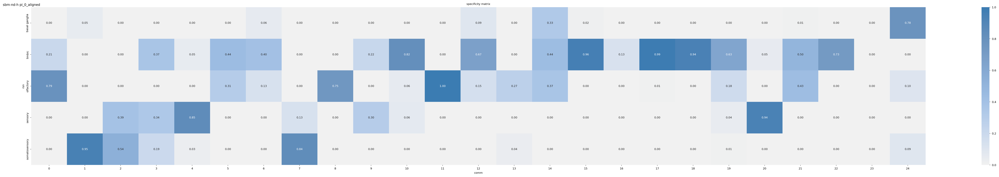

In [26]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
Xs = get_membership_matrix(num_sys, soft_specificity_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, 6*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
mean_X = np.median(Xs, axis=1)[:, args.relevant_comms]
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=rsns_df['name'].to_list(), cmap=cc.cm.CET_L12)
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

In [27]:
# visualizing the matrix and specificity values in 2D as a graph layout.

In [82]:
def compute_force_layout_from_median_matrix(median_spec_matrix, rsn_ids=None, comm_ids=None):
    n_rsn, n_comm = median_spec_matrix.shape

    if rsn_ids is None:
        rsn_ids = [f'rsn_{i}' for i in range(n_rsn)]
    if comm_ids is None:
        comm_ids = [f'comm_{j}' for j in range(n_comm)]

    G = nx.Graph()
    G.add_nodes_from(rsn_ids, bipartite=0)
    G.add_nodes_from(comm_ids, bipartite=1)

    for i, rsn in enumerate(rsn_ids):
        for j, comm in enumerate(comm_ids):
            weight = median_spec_matrix[i, j]
            if weight > 0:
                G.add_edge(rsn, comm, weight=weight)

    layout = nx.spring_layout(G, weight='weight', seed=42)
    return layout

def rescale_layout_to_frame(layout, width_pt=493, height_pt=624, pad_frac=0.1):
    """
    Rescales a spring layout to fit within a fixed figure frame with padding.

    Parameters:
    - layout: dict {node_id: (x, y)} with normalized spring layout
    - width_pt: width of the target figure in points
    - height_pt: height of the target figure in points
    - pad_frac: fraction of width/height to use as padding on each side

    Returns:
    - scaled_layout: dict {node_id: (x_pt, y_pt)} scaled to fit the frame
    """
    coords = np.array(list(layout.values()))
    x_vals, y_vals = coords[:, 0], coords[:, 1]
    x_min, x_max = x_vals.min(), x_vals.max()
    y_min, y_max = y_vals.min(), y_vals.max()

    # Compute available plotting area
    plot_w = width_pt * (1 - 2 * pad_frac)
    plot_h = height_pt * (1 - 2 * pad_frac)
    offset_x = width_pt * pad_frac
    offset_y = height_pt * pad_frac

    # Rescale coordinates
    x_scaled = ((x_vals - x_min) / (x_max - x_min)) * plot_w + offset_x
    y_scaled = ((y_vals - y_min) / (y_max - y_min)) * plot_h + offset_y

    scaled_layout = {
        key: (x_scaled[i], y_scaled[i])
        for i, key in enumerate(layout.keys())
    }

    return scaled_layout

def scale_apart_within_bounds(layout, min_dist=40.0, width_pt=493, height_pt=624, margin=10.0):
    """
    Push nodes apart to enforce a minimum distance, while keeping them within the figure frame bounds.

    Parameters:
    - layout: dict {node_id: (x, y)}
    - min_dist: minimum allowable distance between nodes (in pt)
    - width_pt: figure width in points
    - height_pt: figure height in points
    - margin: buffer from edges (in pt)

    Returns:
    - new_layout: dict {node_id: (x, y)} with spacing adjustments
    """
    from scipy.spatial.distance import pdist, squareform

    keys = list(layout.keys())
    positions = np.array([layout[k] for k in keys])

    def compute_min_distance(pos):
        return np.min(pdist(pos)) if len(pos) > 1 else np.inf

    pos = positions.copy()
    iters = 0
    while compute_min_distance(pos) < min_dist and iters < 500:
        dists = squareform(pdist(pos))
        np.fill_diagonal(dists, np.inf)
        for i in range(len(pos)):
            close = np.where(dists[i] < min_dist)[0]
            for j in close:
                diff = pos[i] - pos[j]
                dist = np.linalg.norm(diff)
                if dist == 0:
                    continue
                push = (min_dist - dist) * (diff / dist)
                pos[i] += push / 2
                pos[j] -= push / 2

        # Clip to frame bounds with margin
        pos[:, 0] = np.clip(pos[:, 0], margin, width_pt - margin)
        pos[:, 1] = np.clip(pos[:, 1], margin, height_pt - margin)
        iters += 1

    return {k: tuple(p) for k, p in zip(keys, pos)}

In [84]:
level = '0'
if level == '0': 
    relevant_comms = [0, 1, 3, 4, 5, 6, 8, 10, 11, 12, 14, 15, 19, 20, 21, 24]
    relevant_comm_ids = [f'comm_{j}' for j in relevant_comms]
else:
    relevant_comms = None
    relevant_comm_ids = None
layout = compute_force_layout_from_median_matrix(np.median(Xs, axis=1)[:, relevant_comms], rsn_ids=None, comm_ids=relevant_comm_ids)
layout = rescale_layout_to_frame(layout, )
layout = scale_apart_within_bounds(layout, min_dist=120)
layout

{'rsn_0': (483.0, 386.582983803299),
 'rsn_1': (246.25173909136882, 356.3978769038719),
 'rsn_2': (214.8718666396824, 118.93920703483354),
 'rsn_3': (129.1014198490522, 493.92025103381405),
 'rsn_4': (355.96880268430783, 528.3730733483188),
 'comm_0': (86.53021439704293, 138.78451179778338),
 'comm_1': (467.2849731858941, 573.1917099280025),
 'comm_3': (247.81371925379733, 476.3877107147918),
 'comm_4': (134.07296092694452, 613.8172225523258),
 'comm_5': (375.8420167804333, 56.44208226734861),
 'comm_6': (456.01036501755436, 148.29648806510198),
 'comm_8': (265.19332499118156, 10.0),
 'comm_10': (127.53943968662362, 373.93041722289416),
 'comm_11': (132.41539360086128, 27.903718468039052),
 'comm_12': (464.21585646048294, 268.06211710407416),
 'comm_14': (338.0516990667034, 170.336295847738),
 'comm_15': (346.24983129998077, 290.0625013696221),
 'comm_19': (119.34548039721089, 254.2104981151557),
 'comm_20': (10.0, 508.5780745400435),
 'comm_21': (238.05777980195606, 236.67795779613346

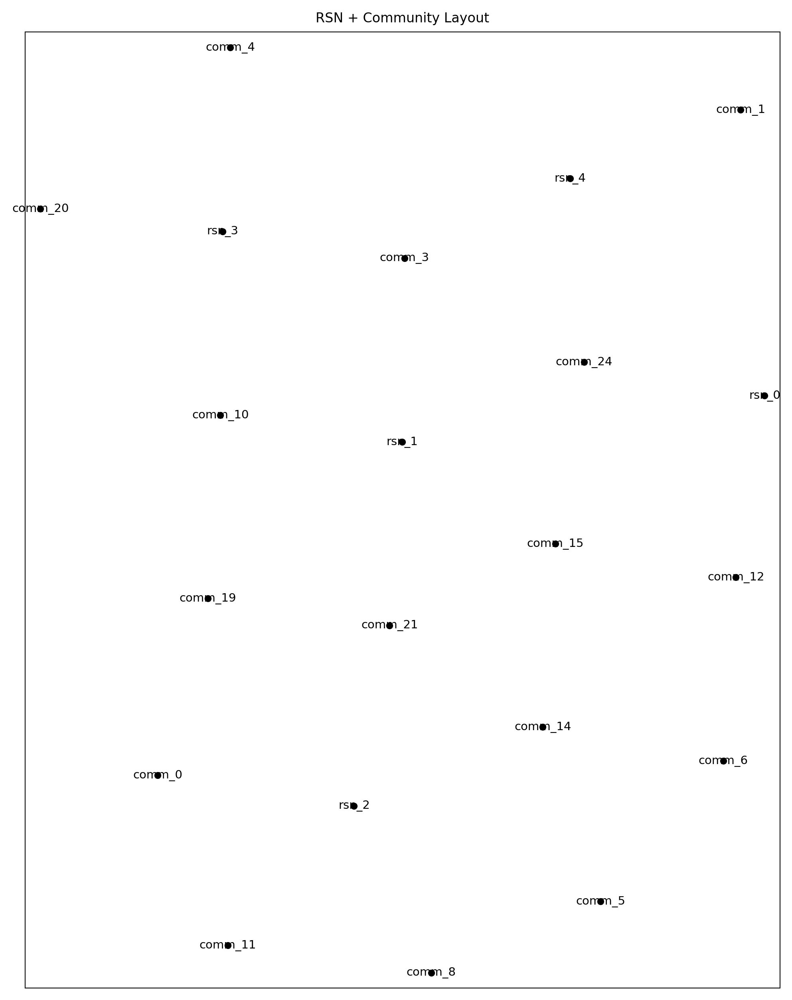

In [85]:
def plot_layout_with_labels(layout_dict, width_pt=493, height_pt=624):
    """
    Visualizes layout with node labels inside a figure frame.
    """
    fig, ax = plt.subplots(figsize=(width_pt / 72, height_pt / 72), dpi=300)

    for key, (x, y) in layout_dict.items():
        ax.scatter(x, y, s=10, color='black')
        ax.text(x, y, key, fontsize=7, ha='center', va='center')

    ax.set_xlim(0, width_pt)
    ax.set_ylim(0, height_pt)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    ax.set_title("RSN + Community Layout", fontsize=8)
    plt.tight_layout()
    return fig, ax

fig, ax = plot_layout_with_labels(layout,)

In [86]:
fig.savefig(f'test.svg', bbox_inches='tight')

In [87]:
def project_modes_to_rsn_space(specificity_df, comm_ids, pi_col, rsn_positions):
    """
    Projects each mode's community specificity vector into RSN layout space.

    Parameters:
    - specificity_df: DataFrame with columns ['sub', 'mode_id', 'omega', pi_col]
    - comm_ids: list of community IDs (e.g., ['comm_0', 'comm_1', ...])
    - pi_col: column containing specificity matrices (shape: n_rsn x n_comm)
    - rsn_positions: dict {rsn_index: (x, y)}

    Returns:
    - DataFrame with one row per mode-community projection:
      ['sub', 'mode_id', 'omega', 'comm_id', 'x', 'y']
    """
    rows = []
    rsn_vecs = np.array([rsn_positions[i] for i in sorted(rsn_positions.keys())])

    for _, row in specificity_df.iterrows():
        spec_matrix = row[pi_col]  # shape: (n_rsn, n_comm)
        if spec_matrix.shape[0] != len(rsn_vecs):
            continue  # skip mismatched RSN dimension
        sub = row['sub']
        mode_id = row['mode_id']
        omega = row['omega']

        spec_matrix = np.asarray(spec_matrix)
        col_sums = spec_matrix.sum(axis=0, keepdims=True)
        norm_spec = np.divide(spec_matrix, col_sums, out=np.zeros_like(spec_matrix), where=col_sums != 0)

        for j, comm_label in enumerate(comm_ids):
            if j >= norm_spec.shape[1]:
                continue
            spec_vec = norm_spec[:, j]
            xy = spec_vec @ rsn_vecs
            rows.append({
                'sub': sub,
                'mode_id': mode_id,
                'omega': omega,
                'comm_id': comm_label,
                'x': xy[0],
                'y': xy[1]
            })

    return pd.DataFrame(rows)

In [91]:
projected_df = project_modes_to_rsn_space(
    specificity_df, 
    comm_ids=[f'comm_{j}' for j in range(25)],
    pi_col='pi_0_aligned',
    rsn_positions={i: pos for i, (name, pos) in enumerate(layout.items()) if name.startswith('rsn')},
)
relevant_comm_ids = [f'comm_{j}' for j in [0, 1, 3, 4, 5, 6, 8, 10, 11, 12, 14, 15, 19, 20, 21, 24]]
projected_df = projected_df[projected_df['comm_id'].isin(relevant_comm_ids)]
projected_df

,sub,mode_id,omega,comm_id,x,y
0,SLC01,0,0.177295,comm_0,214.871867,118.939207
1,SLC01,0,0.177295,comm_1,402.750700,476.155905
3,SLC01,0,0.177295,comm_3,227.150323,452.062054
4,SLC01,0,0.177295,comm_4,133.461853,488.801552
5,SLC01,0,0.177295,comm_5,232.829127,254.825903
...,...,...,...,...,...,...
2115,SLC10,5,0.022894,comm_15,246.251739,356.397877
2119,SLC10,5,0.022894,comm_19,231.879109,359.939491
2120,SLC10,5,0.022894,comm_20,136.492495,485.243892
2121,SLC10,5,0.022894,comm_21,249.034835,185.309708


In [98]:
projected_df[projected_df['comm_id'].isin(['comm_1'])]

,sub,mode_id,omega,comm_id,x,y
1,SLC01,0,0.177295,comm_1,402.750700,476.155905
26,SLC01,1,0.132086,comm_1,400.953693,478.161694
51,SLC01,2,0.122464,comm_1,401.609466,477.429731
76,SLC01,3,0.093199,comm_1,402.666087,476.250349
101,SLC01,4,0.091858,comm_1,400.477179,478.693571
...,...,...,...,...,...,...
2001,SLC10,1,0.233420,comm_1,355.968803,528.373073
2026,SLC10,2,0.226136,comm_1,355.968803,528.373073
2051,SLC10,3,0.204983,comm_1,355.968803,528.373073
2076,SLC10,4,0.062898,comm_1,355.968803,528.373073


In [100]:
def plot_projected_points(projected_df, layout_dict, comm_ids=None, width_pt=493, height_pt=624):
    """
    Plot projected (x, y) points per community on top of the layout, colored by community.
    """
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors

    fig, ax = plt.subplots(figsize=(width_pt / 72, height_pt / 72), dpi=300)

    # Base layout: RSN + community anchors
    for key, (x, y) in layout_dict.items():
        ax.scatter(x, y, s=10, color='black', zorder=2)
        ax.text(x, y, key, fontsize=7, ha='center', va='center', zorder=3)

    # Assign each community a unique color
    if comm_ids is None:
        comm_ids = projected_df['comm_id'].unique()
    cmap = cm.get_cmap('tab20', len(comm_ids))
    comm_to_color = {comm: cmap(i) for i, comm in enumerate(comm_ids)}

    # Plot projected points
    for comm in comm_ids:
        sub_df = projected_df[projected_df['comm_id'] == comm]
        ax.scatter(sub_df['x'], sub_df['y'], s=10, label=comm, color=comm_to_color[comm], alpha=0.6, zorder=1)

    ax.set_xlim(0, width_pt)
    ax.set_ylim(0, height_pt)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    ax.set_title("Projected Mode Points per Community", fontsize=8)
    plt.tight_layout()
    return fig, ax

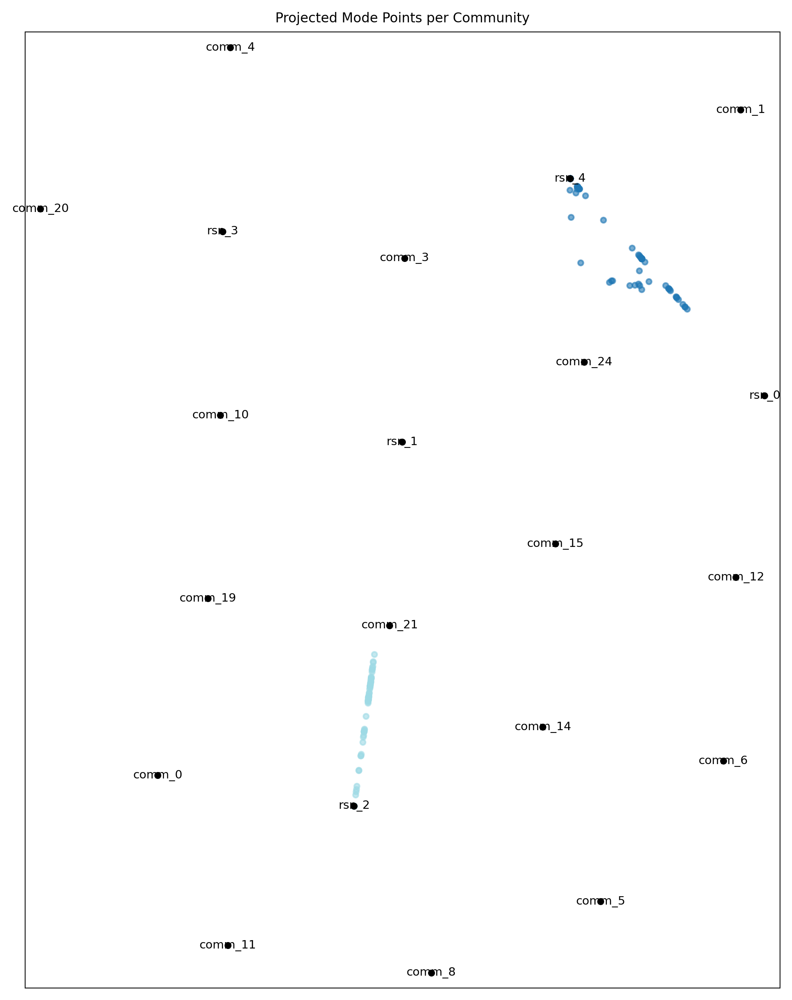

In [102]:
fig, ax = plot_projected_points(projected_df, layout, comm_ids=['comm_1', 'comm_0'])

In [27]:
def bootstrap(matrices, statistic=np.median, n_bootstrap=1000):
    stacked = np.stack(matrices)
    bootstrap_means = np.stack([
        statistic(resample(stacked), axis=0)
        for _ in range(n_bootstrap)
    ])
    return (
        statistic(bootstrap_means, axis=0), # mean := probability of var type per roi
        np.percentile(bootstrap_means, [2.5, 97.5], axis=0) # CI
    )

In [28]:
def get_preferred_rsn_counts(specificity, alpha=0.05):
    """
    specificity: np.ndarray of shape (R, A, C) [RSNs, Animals, Communities]
    Returns: a list of length C, where each entry is a list of RSN indices
             that are statistically indistinguishable from the top RSN.
    """
    R, A, C = specificity.shape
    rsn_counts = [[None for _ in range(C)] for _ in range(R)]  # (R, C)

    for c in range(C):
        S = specificity[:, :, c]  # shape (R, A)
        medians = np.median(S, axis=1)
        r_star = np.argmax(medians)

        # Compare r_star with each r ≠ r_star
        pvals = np.ones(R)
        for r in range(R):
            if r == r_star:
                continue
            try:
                stat, p = wilcoxon(S[r_star], S[r], alternative='greater')
            except ValueError:
                p = 1.0
            pvals[r] = p

        # Bonferroni correction
        corrected_pvals = pvals * (R - 1)
        corrected_pvals = np.clip(corrected_pvals, 0, 1)

        # Identify all RSNs that are *not* significantly worse than r_star
        preferred_rsns = [r for r in range(R) if corrected_pvals[r] >= alpha or r == r_star]

        # Annotate those RSNs with the total count
        count = len(preferred_rsns)
        for r in preferred_rsns:
            rsn_counts[r][c] = f'({count})'

    return rsn_counts  # shape (R, C), entries are like '(2)', '(3)', or None

100%|██████████| 5/5 [00:33<00:00,  6.62s/it]


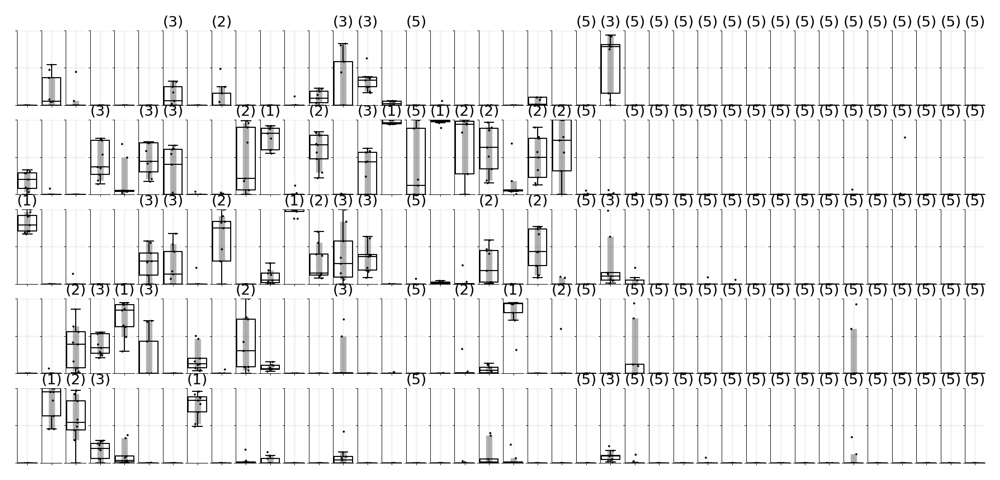

In [ ]:
# # === Data Setup ===
# specificity = Xs  # shape: (5 RSNs, 9 animals, 24 communities)
# rsn_names = ['basal ganglia', 'limbic', 'olfactory', 'sensory', 'somatosensory']
# comm_labels = [str(i) for i in range(specificity.shape[2])]

# annotations = get_preferred_rsn_counts(specificity)

# # === Plot Setup ===
# pt_to_in = 1 / 72.27
# w_pt, h_pt = 15, 54  # axes size in points
# fig_w = w_pt * specificity.shape[2] * pt_to_in
# fig_h = h_pt * specificity.shape[0] * pt_to_in

# fig, axs = plt.subplots(
#     nrows=specificity.shape[0],
#     ncols=specificity.shape[2],
#     figsize=(fig_w, fig_h),
#     squeeze=False
# )

# for r in tqdm(range(specificity.shape[0])):
#     for c in range(specificity.shape[2]):
#         ax = axs[r, c]
        
#         label = annotations[r][c]
#         if label is not None:
#             ax.text(
#                 0.50, 1.02, label,  # position above the box
#                 ha='center', va='bottom',
#                 fontsize=7,
#                 transform=ax.transAxes
#             )
        
#         sns.boxplot(
#             y=specificity[r, :, c],
#             ax=ax,
#             width=0.6,
#             color="#000000",
#             fliersize=0,
#             fill=False,
#             linewidth=0.5,
#         )
#         sns.stripplot(
#             y=specificity[r, :, c],
#             ax=ax,
#             color='#000000',
#             size=1,
#             jitter=0.1,
#         )
        
#         vals = specificity[r, :, c]  # shape: (9,)
#         point, (ci_lo, ci_hi) = bootstrap(vals, statistic=np.median, n_bootstrap=1000)

#         # Plot median line and CI bar
#         # ax.hlines(point, xmin=-0.2, xmax=0.2, color='black', linewidth=0.5)
#         ax.vlines(0, ci_lo, ci_hi, color='black', linewidth=3.0, alpha=0.3)
        
        
#         ax.set_ylim(0, 1)

#         # Add proper mathematical axes
#         ax.tick_params(
#             axis='y', which='major',
#             direction='out', length=1.0, width=0.25,
#             labelsize=0,  # hide labels, keep ticks,
#             # labelleft=False,
#         )
#         ax.tick_params(
#             axis='x', which='major',
#             direction='out', length=1.0, width=0.25,
#             labelsize=0,
#             # labelbottom=False
#         )

#         ax.set_xticks([0])
#         ax.set_yticks([0, 0.5, 1])
#         ax.set_xticklabels([])
#         ax.set_yticklabels([])
        
        
        
#         ax.grid(alpha=0.15)

#         # Only show left and bottom spines
#         for spine_loc, spine in ax.spines.items():
#             if spine_loc in ['left', 'bottom']:
#                 spine.set_visible(True)
#                 spine.set_linewidth(0.25)
#             else:
#                 spine.set_visible(False)

In [ ]:
# folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
# os.system(f'mkdir -p {folder}')
# fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix-boxplots.svg', bbox_inches='tight')

In [32]:
# 1. assign a comm. to the rsn with maximal specificity

In [33]:
def assign_comms(X, ):
    if np.isnan(X).all(): return np.nan
    assignments = (X == np.max(X, axis=0, keepdims=True)).astype(int)
    return np.where(assignments, 1, 0)

In [34]:
spec_assign_df = pd.concat(
    [
        specificity_df[['sub', 'sbm']],
        specificity_df[cols].applymap(lambda X: assign_comms(X,)),
        specificity_df[['omega', 'mode_id']],
    ],
    axis=1
)
soft_spec_assign_df = get_soft_estim_df(spec_assign_df, num_sys)
soft_spec_assign_df

,sub,sbm,pi_0_aligned,pi_1_aligned,pi_2_aligned,pi_3_aligned,pi_4_aligned,pi_5_aligned,pi_6_aligned,pi_7_aligned,pi_8_aligned
0,SLC01,sbm-nd-h,"[[0.0, 0.0, 2.000400080016003e-05, 0.0, 0.0, 0...","[[0.0, 0.0, 0.14700940188037606, 0.0, 0.0, 0.0...","[[0.0, 0.843128625725145, 0.9489297859571915, ...","[[0.0, 0.9315463092618523], [1.0, 0.9315463092...","[[0.0, 0.5093418683736747], [1.0, 0.5093418683...","[[0.0, 0.26915383076615323], [1.0, 0.269153830...","[[0.0, 0.17729545909181837], [1.0, 0.177295459...","[[0.0, 0.17729545909181837], [1.0, 0.177295459...","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
1,SLC03,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.999979995999...","[[2.000400080016003e-05, 0.0, 0.0, 0.0, 0.0, 0...","[[0.0, 0.3614122824564913, 0.6385677135427085,...","[[0.0, 0.9999799959991998, 0.6385677135427085,...","[[0.0, 0.9393078615723145], [1.0, 0.9393078615...","[[0.0, 0.5778955791158231], [1.0, 0.5778955791...","[[0.0, 0.46929385877175434], [1.0, 0.469293858...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
2,SLC04,sbm-nd-h,"[[0.0, 0.9854458216713315, 0.0, 0.0, 0.0, 0.34...","[[0.0, 0.0, 1.0000000000000002, 0.0, 0.0, 0.0,...","[[0.0, 0.9368852459016395, 0.9658936425429829,...","[[0.0, 0.9658936425429829], [1.000000000000000...","[[0.0, 0.3810875649740104], [1.000000000000000...","[[0.0, 0.24100359856057577], [1.00000000000000...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
3,SLC05,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.43...","[[0.301620324064813, 0.2599119823964793, 0.794...","[[0.0, 0.8864372874574914, 0.8119423884776954,...","[[0.0, 0.943008601720344, 0.06419283856771354,...","[[0.0, 0.5971194238847769], [0.999999999999999...","[[0.0, 0.07269453890778156], [0.99999999999999...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
4,SLC06,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...","[[1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...","[[0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1....","[[0.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1.0, 1.0, 1....","[[0.0, 1.0], [1.0, 1.0], [0.0, 1.0], [0.0, 1.0...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
5,SLC07,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.69...","[[0.23920784156831365, 0.9594118823764753, 1.0...","[[0.0, 0.6949989997999599, 0.9702740548109622,...","[[0.0, 0.9702740548109622, 0.23920784156831365...","[[0.0, 0.6118423684736948], [1.0, 0.6118423684...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
6,SLC08,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.894954990998...","[[0.962152430486097, 0.18089217843568714, 0.98...","[[0.0, 0.8958351670334065, 0.9552390478095616,...","[[0.0, 0.9880776155231042, 0.1248249649929986,...","[[0.0, 0.31819163832766556], [0.99999999999999...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
7,SLC09,sbm-nd-h,"[[0.0, 0.8848060775689724, 0.118312674930028, ...","[[0.03268692522990804, 0.8474410235905638, 0.1...","[[0.0, 0.5134946021591364, 0.9626349460215915,...","[[0.0, 0.9626349460215915, 0.3021791283486606,...","[[0.0, 0.4085965613754499], [1.000000000000000...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"
8,SLC10,sbm-nd-h,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...","[[0.26788072843706223, 0.26788072843706223, 1....","[[0.0, 1.0, 0.9771062637582549, 0.743686211727...","[[0.0, 0.9771062637582549], [1.0, 0.9771062637...","[[0.0, 0.914208525115069], [1.0, 0.91420852511...","[[0.0, 0.24966980188112867], [1.0, 0.249669801...","[[0.0], [1.0],

In [35]:
for idx, row in tqdm(soft_spec_assign_df.iterrows()):
    sub = row['sub']
    folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
    os.system(f'mkdir -p {folder}')

    for col in cols:
        X = row[col]
        try: X = X[:, args.relevant_comms]
        except: pass
        n_comms = X.shape[-1]

        ncols = 1
        nrows = 1
        fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, 6*nrows),)
        fig.tight_layout(h_pad=3, w_pad=3)
        fig.suptitle(f'{SBM} {col} {sub}', x=0.0, y=1.0)
        ax = axs
        
        sns.heatmap(X, ax=ax, annot=True, fmt='.2f', yticklabels=rsns_df['name'].to_list(), cmap=cc.cm.CET_L12)
        ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

        fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-assignment-matrix.pdf', bbox_inches='tight')

    plt.close('all')

0it [00:00, ?it/s]

9it [00:25,  2.81s/it]


In [36]:
estim_df = soft_spec_assign_df
group_assign_df = []
for col in cols:
    M = get_membership_matrix(num_sys, estim_df, col=col)
    m, ci = bootstrap(
        [M[:, i, :] for i in range(M.shape[1])], 
        n_bootstrap=100,
    )
    row = pd.DataFrame(dict(
        sbm=[SBM],
        col=[col],
        vals=[np.squeeze(M)],
        mean=[m],
        cil=[ci[0]],
        ciu=[ci[1]],
    ))
    group_assign_df += [row]
group_assign_df = pd.concat(group_assign_df).reset_index(drop=True)
group_assign_df

,sbm,col,vals,mean,cil,ciu
0,sbm-nd-h,pi_0_aligned,"[[[0.0, 0.0, 2.000400080016003e-05, 0.0, 0.0, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.11...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 2.000400080016003e-05, 0.0, 0.0, 0..."
1,sbm-nd-h,pi_1_aligned,"[[[0.0, 0.0, 0.14700940188037606, 0.0, 0.0, 0....","[[0.23920784156831365, 0.18089217843568714, 0....","[[2.000400080016003e-05, 0.0, 0.14320561543336...","[[0.962152430486097, 0.5721498833926456, 1.0, ..."
2,sbm-nd-h,pi_2_aligned,"[[[0.0, 0.843128625725145, 0.9489297859571915,...","[[0.0, 0.8864372874574914, 0.9626349460215915,...","[[0.0, 0.6949989997999599, 0.9489297859571915,...","[[0.0, 1.0, 0.9771062637582549, 0.898467463484..."
3,sbm-nd-h,pi_3_aligned,"[[[0.0, 0.9315463092618523, 0.0, 0.0, 0.0, 0.0...","[[0.0, 0.9702740548109622, 0.1248249649929986,...","[[0.0, 0.9523311152634365, 0.0, 0.0, 0.0, 0.0]...","[[0.0, 0.9999799959991998, 0.6385677135427085,..."
4,sbm-nd-h,pi_4_aligned,"[[[0.0, 0.5093418683736747], [0.0, 0.939307861...","[[0.0, 0.5971194238847769], [1.0, 0.5971194238...","[[0.0, 0.3941543382646942], [0.999999999999999...","[[0.0, 0.914208525115069], [1.0, 0.91420852511..."
5,sbm-nd-h,pi_5_aligned,"[[[0.0, 0.26915383076615323], [0.0, 0.57789557...","[[0.0, 0.07269453890778156], [1.0, 0.072694538...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0...","[[0.0, 0.24966980188112867], [1.0, 0.249669801..."
6,sbm-nd-h,pi_6_aligned,"[[[0.0, 0.17729545909181837], [0.0, 0.46929385...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0...","[[0.0, 0.17729545909181837], [1.0, 0.177295459..."
7,sbm-nd-h,pi_7_aligned,"[[[0.0, 0.17729545909181837], [0.0, 0.0], [0.0...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0...","[[0.0, 0.0], [1.0, 0.0], [0.0, 0.0], [0.0, 0.0..."
8,sbm-nd-h,pi_8_aligned,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]...","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]","[[0.0], [1.0], [0.0], [0.0], [0.0]]"


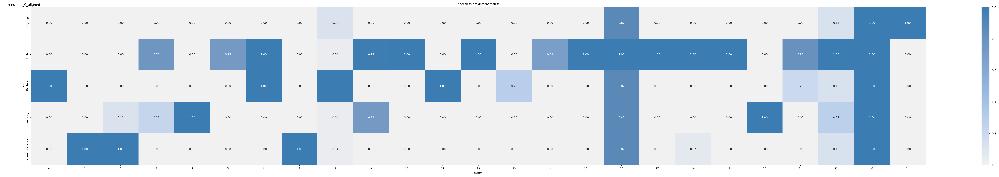

In [37]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
X = group_assign_df.at[0, 'mean']
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, 6*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
mean_X = X[:, args.relevant_comms]
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=rsns_df['name'].to_list(), cmap=cc.cm.CET_L12)
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} assignment matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-assignment-matrix.pdf', bbox_inches='tight')
# plt.close('all')

In [38]:
# 2. spatial overlap using specificity-entropy per comm

In [39]:
a = np.array([0.0, 0.25, 0.25, 0.25, 0.25])
stats.entropy(a, base=2, axis=0) / np.log2(a.shape[0])

0.8613531161467861

In [46]:
pi = specificity_df.at[0, 'pi_0_aligned']
np.exp(stats.entropy(pi)), stats.entropy(pi)

(array([1.        , 1.93098266, 1.87820855, 2.9417765 , 1.17234844,
        1.97915349, 2.21383119, 2.09012483, 1.41391262, 1.22575953,
        1.37117699, 1.        , 2.11023297, 1.7984337 , 2.90599695,
        1.        , 1.        , 1.        , 1.        , 2.7941871 ,
        1.26376411, 1.72379889, 1.        ,        nan,        nan,
               nan,        nan,        nan]),
 array([0.        , 0.65802903, 0.63031843, 1.07901365, 0.15900895,
        0.68266922, 0.79472459, 0.73722379, 0.34636077, 0.20356068,
        0.31566949, 0.        , 0.74679835, 0.58691612, 1.06677652,
        0.        , 0.        , 0.        , 0.        , 1.02754122,
        0.23409466, 0.54453051, 0.        ,        nan,        nan,
               nan,        nan,        nan]))

In [49]:
def exp_entropy(pi, num_sys, axis=0):
    if isinstance(pi, np.ndarray):
        # ent = stats.entropy(pi, base=2, axis=axis) / np.log2(pi.shape[axis])
        # ent = np.nan_to_num(ent)
        E = np.exp(stats.entropy(pi))
        E = np.nan_to_num(E)
    elif np.isnan(pi):
        E = np.zeros((num_sys,))
    return E

In [50]:
specificity_ent_df = pd.concat(
    [
        specificity_df[['sub', 'sbm']],
        specificity_df[cols].applymap(lambda X: exp_entropy(X, num_sys, axis=0)),
        specificity_df[['omega', 'mode_id']],
    ],
    axis=1
)
soft_specificity_ent_df = get_soft_estim_df(specificity_ent_df, 1)
soft_specificity_ent_df

,sub,sbm,pi_0_aligned,pi_1_aligned,pi_2_aligned,pi_3_aligned,pi_4_aligned,pi_5_aligned,pi_6_aligned,pi_7_aligned,pi_8_aligned
0,SLC01,sbm-nd-h,"[[1.2343481179729467, 1.953564512527187, 2.092...","[[2.709105212394379, 3.157726006794817, 2.5743...","[[4.1923205273428445, 0.2165721112567515, 0.0,...","[[4.205264431601613, 0.0]]","[[4.206968609695761, 0.0]]","[[4.207253205609639, 0.0]]","[[4.207225077291344, 0.0]]","[[4.207225077291344, 0.0]]",[[4.207357428337048]]
1,SLC03,sbm-nd-h,"[[1.8256869535219715, 1.2135779970356217, 1.53...","[[3.3579920464966895, 1.9610917005559074, 1.79...","[[4.071395252496856, 2.7836850338341765, 0.0, ...","[[4.1996250451688795, 0.0, 0.0, 0.0, 0.0, 0.0]]","[[4.206385565018635, 0.0]]","[[4.207220586050955, 0.0]]","[[4.207291741233348, 0.0]]",[[4.207357428337048]],[[4.207357428337048]]
2,SLC04,sbm-nd-h,"[[1.8883605625503745, 2.4311912962842044, 2.08...","[[2.1103438331994524, 3.7147569597312438, 0.0,...","[[4.1714486903930865, 0.23437533073133315, 0.0...","[[4.202526313019324, 0.0]]","[[4.206819681705505, 0.0]]","[[4.207252923265574, 0.0]]",[[4.207357428337047]],[[4.207357428337047]],[[4.207357428337047]]
3,SLC05,sbm-nd-h,"[[0.9999999999999999, 0.9999999999999999, 1.49...","[[3.4534566359293835, 1.7490842101624493, 0.53...","[[4.164369896381666, 0.38398989584739246, 0.0,...","[[4.201486110314457, 0.0, 0.0, 0.0, 0.0]]","[[4.206527230816466, 0.0]]","[[4.20726467093586, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]
4,SLC06,sbm-nd-h,"[[1.3739745573683733, 1.7321165629840112, 1.13...","[[3.0093689901811915, 1.4354991988798258, 0.0,...","[[4.207265840228693, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[4.207615006326627, 0.0, 0.0, 0.0, 0.0, 0.0]]","[[4.207388320628698, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]
5,SLC07,sbm-nd-h,"[[1.1509231706174472, 1.1956949739507199, 1.98...","[[1.8108175008941028, 0.14443964657256664, 0.0...","[[4.111011484000587, 1.3706402764807273, 0.0, ...","[[4.196581013065673, 0.0, 0.0, 0.0, 0.0, 0.0]]","[[4.204503732028776, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]
6,SLC08,sbm-nd-h,"[[1.832526898082331, 1.0058442656131517, 1.307...","[[2.8911973585957016, 3.0419212763638908, 0.03...","[[4.208458363714377, 0.4662075132428577, 0.0, ...","[[4.203901862018558, 0.0, 0.0, 0.0, 0.0]]","[[4.207169015981619, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]
7,SLC09,sbm-nd-h,"[[1.826935621729073, 1.9782671527873346, 1.750...","[[3.46836017517442, 3.7980885606690507, 1.8982...","[[4.0927911708015445, 1.1952872002109236, 0.0,...","[[4.195087168270648, 0.0, 0.0, 0.0, 0.0]]","[[4.207031441752837, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]
8,SLC10,sbm-nd-h,"[[1.6618584773745146, 1.0, 1.7087966764113067,...","[[3.172417173205887, 2.5587065778976843, 0.0, ...","[[4.173664352891558, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[4.201506039322736, 0.0]]","[[4.206184817512883, 0.0]]","[[4.207263703466291, 0.0]]",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]


In [51]:
estim_df = soft_specificity_ent_df
group_ents_df = []
for col in cols:
    M = get_membership_matrix(1, estim_df, col=col)
    m, ci = bootstrap(
        [M[:, i, :] for i in range(M.shape[1])], 
        n_bootstrap=100,
    )
    row = pd.DataFrame(dict(
        sbm=[SBM],
        col=[col],
        vals=[np.squeeze(M)],
        mean=[m],
        cil=[ci[0]],
        ciu=[ci[1]],
    ))
    group_ents_df += [row]
group_ents_df = pd.concat(group_ents_df).reset_index(drop=True)
group_ents_df

,sbm,col,vals,mean,cil,ciu
0,sbm-nd-h,pi_0_aligned,"[[1.2343481179729467, 1.953564512527187, 2.092...","[[1.6618584773745146, 1.2135779970356217, 1.70...","[[1.2343481179729467, 1.0, 1.3939791507073764,...","[[1.826935621729073, 1.9665333986637643, 2.081..."
1,sbm-nd-h,pi_1_aligned,"[[2.709105212394379, 3.157726006794817, 2.5743...","[[3.0093689901811915, 2.5587065778976843, 0.03...","[[2.1103438331994524, 1.4354991988798258, 0.0,...","[[3.3579920464966895, 3.7147569597312438, 1.84..."
2,sbm-nd-h,pi_2_aligned,"[[4.1923205273428445, 0.2165721112567515, 0.0,...","[[4.1714486903930865, 0.38398989584739246, 0.0...","[[4.0927911708015445, 0.10287175284695697, 0.0...","[[4.207265840228693, 1.1952872002109236, 0.0, ..."
3,sbm-nd-h,pi_3_aligned,"[[4.205264431601613, 0.0, 0.0, 0.0, 0.0, 0.0],...","[[4.201506039322736, 0.0, 0.0, 0.0, 0.0, 0.0]]","[[4.1996250451688795, 0.0, 0.0, 0.0, 0.0, 0.0]]","[[4.204617211049662, 0.0, 0.0, 0.0, 0.0, 0.0]]"
4,sbm-nd-h,pi_4_aligned,"[[4.206968609695761, 0.0], [4.206385565018635,...","[[4.206819681705505, 0.0]]","[[4.206280172578115, 0.0]]","[[4.207031441752837, 0.0]]"
5,sbm-nd-h,pi_5_aligned,"[[4.207253205609639, 0.0], [4.207220586050955,...","[[4.20726467093586, 0.0]]","[[4.207253057379005, 0.0]]","[[4.207357428337048, 0.0]]"
6,sbm-nd-h,pi_6_aligned,"[[4.207225077291344, 0.0], [4.207291741233348,...","[[4.207357428337048, 0.0]]","[[4.207291741233348, 0.0]]","[[4.207357428337048, 0.0]]"
7,sbm-nd-h,pi_7_aligned,"[[4.207225077291344, 0.0], [4.207357428337048,...","[[4.207357428337048, 0.0]]","[[4.207357428337047, 0.0]]","[[4.207357428337048, 0.0]]"
8,sbm-nd-h,pi_8_aligned,"[4.207357428337048, 4.207357428337048, 4.20735...",[[4.207357428337048]],[[4.207357428337048]],[[4.207357428337048]]


In [75]:
def plot_ents(df, SBM, col, relevant_comms=None, xlabel='comm'):
    # X : (num_sub x num_comms)
    X = df['vals']
    mX = df['mean']
    cil = df['cil']
    ciu = df['ciu']
    try: 
        X = X[:, relevant_comms]
        mX = mX[:, relevant_comms]
        cil = cil[:, relevant_comms]
        ciu = ciu[:, relevant_comms]
    except:
        pass


    n_comms = X.shape[-1]
    print(n_comms)
    
    fig, axs = plt.subplots(1, 1, figsize=(250/72.27, 178/72.27))  # ~ 3.23 x 2.46 in
    ax = axs

    sns.stripplot(X, ax=ax, color='cornflowerblue', size=3)
    sns.boxplot(X, ax=ax, fill=False, color='grey', showfliers=0)

    ax.scatter(
        range(n_comms),
        mX,
        c='salmon', marker='o', s=10, label='median'
    )
    ax.vlines(
        range(n_comms),
        cil, ciu,
        color='cornflowerblue',
        linewidth=5, alpha=0.3, label='95% CI',
    )

    bands = [
        (1.00, 1.25, '#88CCEE', '1.0'),
        (1.25, 1.75, '#F0E442', '1.5'),
        (1.75, 2.25, '#E69F00', '2.0'),
        (2.25, 2.75, '#D55E00', '2.5'),
        (2.75, 3.35, '#A00000', '3.0+'),
    ]

    for y1, y2, color, label in bands:
        ax.fill_between(
            x=np.arange(-0.5, n_comms + 0.5),
            y1=y1, y2=y2,
            color=color,
            alpha=0.15,
            label=label
        )

    # ax.set(ylabel=f'entropy', xlabel=f'{xlabel}', title=f'{SBM} {col}')
    ax.set(ylabel=f'', xlabel=f'', title=f'')
    # ax.set(ylim=[0, 1], xlim=[-0.65, n_comms])
    ax.set_ylim(bottom=1.0, top=3.35)
    ax.yaxis.set_label_position("right")
    ax.yaxis.tick_right()
    ax.set_xticklabels([f'{i:02d}' for i in relevant_comms], rotation=90)
    # ax.set_yticklabels([f'{i:.1f}' for i in np.arange(0, 1+0.2, 0.2)], rotation=90) 
    ax.tick_params(axis='y', rotation=90)
    
    ax.grid(alpha=0.15)
    ax.legend()
    return fig

In [66]:
def plot_ents_vertical(df, SBM, col, relevant_comms=None, ylabel='comm'):
    if relevant_comms is not None:
        X = df['vals'][:, relevant_comms]
        mX = df['mean'][:, relevant_comms]
        cil = df['cil'][:, relevant_comms]
        ciu = df['ciu'][:, relevant_comms]
        n_comms = len(relevant_comms)
    else:
        X = df['vals']
        mX = df['mean']
        cil = df['cil']
        ciu = df['ciu']
        n_comms = X.shape[-1]

    # Convert to long-form dataframe for seaborn
    num_animals = X.shape[0]
    long_df = pd.DataFrame({
        'entropy': X.flatten(),
        'comm': np.repeat([f'{i:02d}' for i in relevant_comms], num_animals)
    })

    fig, ax = plt.subplots(1, 1, figsize=(178/72.27, 233/72.27))  # ~2.46 x 3.23 in

    # Now use the dataframe for plotting
    sns.stripplot(data=long_df, x='entropy', y='comm', color='cornflowerblue', size=3, ax=ax)
    sns.boxplot(data=long_df, x='entropy', y='comm', fill=False, color='grey', showfliers=0, ax=ax)

    # Add median and CI overlays
    yvals = [f'{i:02d}' for i in relevant_comms]
    for i, label in enumerate(yvals):
        ax.scatter(mX[0, i], label, c='salmon', s=15, zorder=3)
        ax.plot([cil[0, i], ciu[0, i]], [label]*2, color='cornflowerblue', linewidth=4, alpha=0.3)


    # Horizontal entropy bands
    ax.axvspan(0.00, 0.21, color='#117733', alpha=0.15, label='1')
    ax.axvspan(0.21, 0.55, color='#fdc500', alpha=0.15, label='2')
    ax.axvspan(0.55, 0.77, color='#e8601c', alpha=0.15, label='3')
    ax.axvspan(0.77, 1.00, color='#cc0000', alpha=0.15, label='4+')

    ax.set(
        xlabel='',# 'entropy',
        ylabel='', #ylabel,
        xlim=[0, 1],
        title='',#f'{SBM} {col}'
    )
    ax.grid(alpha=0.2)
    ax.legend()
    fig.tight_layout()
    return fig


16


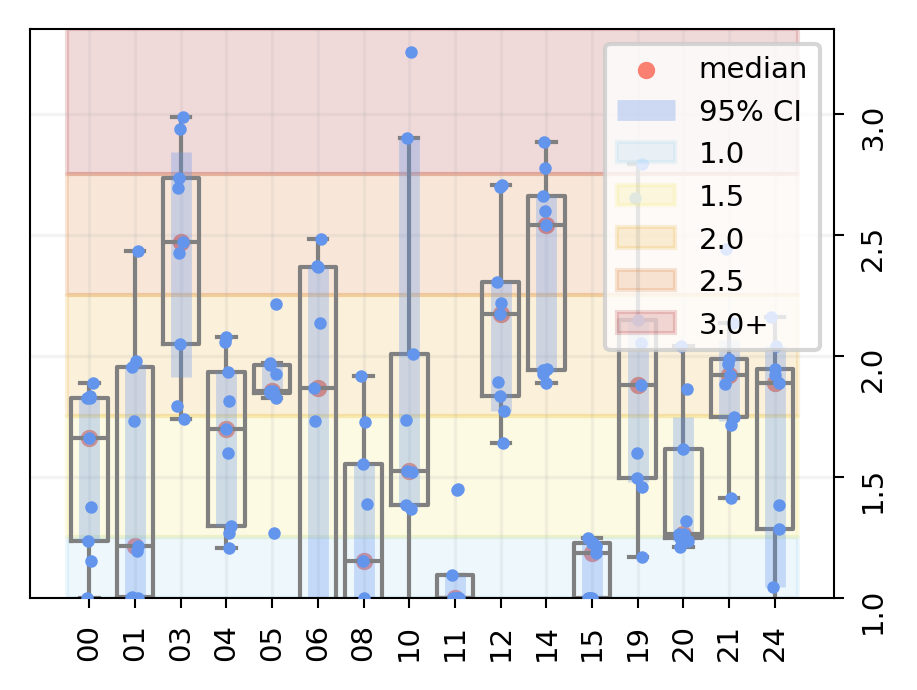

In [76]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

for idx, row in group_ents_df.iterrows():
    col = row['col']
    level = row['col'].split('_')[1]
    level = -1 if level == 'aligned' else level
    if int(level) > 0: continue
    if level == '0': 
        relevant_comms = [0, 1, 3, 4, 5, 6, 8, 10, 11, 12, 14, 15, 19, 20, 21, 24]
    else:
        relevant_comms = None
    fig = plot_ents(row, SBM, col, relevant_comms)
    # fig = plot_ents_vertical(row, SBM, col, relevant_comms, ylabel='comm')
    fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-entropy-matrix.svg', bbox_inches='tight')
    # plt.close('all')
    break

In [74]:
relevant_comms
mX = row['mean']
X = row['vals']
X[:, relevant_comms]

array([[1.23434812e+00, 1.95356451e+00, 2.93667524e+00, 1.20751454e+00,
        1.97083629e+00, 2.37136918e+00, 1.15085576e+00, 1.36927157e+00,
        1.00000000e+00, 2.22031568e+00, 2.88371552e+00, 1.00000000e+00,
        2.79371813e+00, 1.31733253e+00, 1.74558207e+00, 6.12063376e-01],
       [1.82568695e+00, 1.21357800e+00, 2.73447344e+00, 1.81205547e+00,
        1.85631887e+00, 3.87842276e-05, 1.00000000e+00, 1.52377650e+00,
        1.44494043e+00, 2.30332663e+00, 2.66161037e+00, 1.24728025e+00,
        1.87950200e+00, 1.21261913e+00, 1.88532448e+00, 1.92176706e+00],
       [1.88836056e+00, 2.43119130e+00, 2.42394606e+00, 2.07729134e+00,
        1.27023711e+00, 1.73111324e+00, 1.72592646e+00, 2.89976327e+00,
        1.09606150e+00, 1.89300941e+00, 2.54112607e+00, 1.21490165e+00,
        2.05263077e+00, 1.23438118e+00, 1.92123954e+00, 1.04378728e+00],
       [1.00000000e+00, 1.00000000e+00, 2.69334967e+00, 2.05868056e+00,
        1.82808102e+00, 2.13644895e+00, 1.91885166e+00, 1.736

In [41]:
# 3. specificities within an rsn

In [42]:
def rsn_specificity(X, num_sys, axis=0, thresh=0.2):
    if np.isnan(X).all(): return np.nan
    else:
        Xm = np.ma.masked_equal(X * (X > thresh), 0.0)
        return np.ma.median(Xm, axis=1).filled(0)

In [43]:
rsn_spec_df = pd.concat(
    [
        specificity_df[['sub', 'sbm']],
        specificity_df[cols].applymap(lambda X: rsn_specificity(X, num_sys, axis=0, thresh=0.2)), #(fa[:, :X.shape[-1]] * X) instead of X
        specificity_df[['omega', 'mode_id']],
    ],
    axis=1
)
soft_rsn_spec_df = get_soft_estim_df(rsn_spec_df, 1)
soft_rsn_spec_df

,sub,sbm,pi_0_aligned,pi_1_aligned,pi_2_aligned,pi_3_aligned,pi_4_aligned,pi_5_aligned,pi_6_aligned,pi_7_aligned,pi_8_aligned
0,SLC01,sbm-nd-h,"[[0.3644331887103446, 0.7548703611401577, 0.72...","[[0.26457972933628177, 0.5041186124919736, 0.4...","[[5.600186735884447e-06, 0.49037020498040607, ...","[[0.0, 0.450025744478321, 0.0, 0.0, 0.0]]","[[0.0, 0.4497847020827536, 0.0, 0.0, 0.0]]","[[0.0, 0.4497491341344471, 0.0, 0.0, 0.0]]","[[0.0, 0.44975525919346154, 0.0, 0.0, 0.0]]","[[0.0, 0.44975525919346154, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]"
1,SLC03,sbm-nd-h,"[[0.34557347107281966, 0.693860809479959, 0.68...","[[0.21681180587745855, 0.7178396340773252, 0.5...","[[0.0, 0.4277383731904519, 0.405300361282363, ...","[[0.0, 0.4513783425979454, 0.0, 0.0, 0.0]]","[[0.0, 0.44993442112910165, 0.0, 0.0, 0.0]]","[[0.0, 0.4497600086552976, 0.0, 0.0, 0.0]]","[[0.0, 0.44974351028330034, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]"
2,SLC04,sbm-nd-h,"[[0.4249431431861862, 0.7741454027909951, 0.75...","[[0.25052729892732695, 0.55056747121452, 0.412...","[[0.016352052496313673, 0.4562680840627287, 0....","[[0.0, 0.4506091233064172, 0.0, 0.0, 0.0]]","[[0.0, 0.4498258015114403, 0.0, 0.0, 0.0]]","[[0.0, 0.44974877748093306, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683045, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683045, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683045, 0.0, 0.0, 0.0]]"
3,SLC05,sbm-nd-h,"[[0.6424499079645623, 0.8400109076105946, 0.52...","[[0.3357785224125402, 0.5423940871484163, 0.33...","[[0.0, 0.4570868634365706, 0.0, 0.037033520310...","[[0.0, 0.4507590553762546, 0.0, 0.0, 0.0]]","[[0.0, 0.4498743624157032, 0.0, 0.0, 0.0]]","[[0.0, 0.44974811596434416, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]"
4,SLC06,sbm-nd-h,"[[0.6616625434367399, 0.6178529991224686, 0.57...","[[0.5181334761833356, 0.6362003714290776, 0.61...","[[0.0, 0.4466213934170999, 0.0, 0.0, 0.0]]","[[0.0, 0.4493073015042148, 0.0, 0.0, 0.0]]","[[0.0, 0.4496751958278822, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]"
5,SLC07,sbm-nd-h,"[[0.4877866011381588, 0.7731974743452845, 0.42...","[[0.20901123687340506, 0.6419407432175549, 0.4...","[[0.07116745027882453, 0.46655146448394375, 0....","[[0.0, 0.4516404912299552, 0.0, 0.0, 0.0]]","[[0.0, 0.45023795832078783, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]"
6,SLC08,sbm-nd-h,"[[0.7579323624983453, 0.9048336678501091, 0.60...","[[0.5539471610194551, 0.6451788125026998, 0.28...","[[0.011321270920434563, 0.4493455731028832, 0....","[[0.0, 0.4503298957334214, 0.0, 0.0, 0.0]]","[[0.0, 0.44975950785951047, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]"
7,SLC09,sbm-nd-h,"[[0.3660611191214388, 0.8686908850172929, 0.77...","[[0.3407801357605805, 0.733852642766308, 0.465...","[[0.013993177810505757, 0.465606798840055, 0.0...","[[0.0, 0.451672459542033, 0.0, 0.0, 0.0]]","[[0.0, 0.4497879527402092, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]"
8,SLC10,sbm-nd-h,"[[0.5613175451208731, 0.7758175630312927, 0.72...","[[0.387181771243439, 0.44786464241413604, 0.31...","[[0.0, 0.455519914251685, 0.0, 0.0, 0.0]]","[[0.0, 0.45073726891184396, 0.0, 0.0, 0.0]]","[[0.0, 0.44993492063680074, 0.0, 0.0, 0.0]]","[[0.0, 0.449748710881357, 0.0, 0.0, 0.0]]","[[0.0, 0.44

In [44]:
estim_df = soft_rsn_spec_df
group_rsn_spec_df = []
for col in cols:
    M = get_membership_matrix(1, estim_df, col=col)
    m, ci = bootstrap(
        [M[:, i, :] for i in range(M.shape[1])], 
        n_bootstrap=100,
    )
    row = pd.DataFrame(dict(
        sbm=[SBM],
        col=[col],
        vals=[np.squeeze(M)],
        mean=[m],
        cil=[ci[0]],
        ciu=[ci[1]],
    ))
    group_rsn_spec_df += [row]
group_rsn_spec_df = pd.concat(group_rsn_spec_df).reset_index(drop=True)
group_rsn_spec_df

,sbm,col,vals,mean,cil,ciu
0,sbm-nd-h,pi_0_aligned,"[[0.3644331887103446, 0.7548703611401577, 0.72...","[[0.4877866011381588, 0.7741454027909951, 0.68...","[[0.3644331887103446, 0.7228403465185533, 0.57...","[[0.6616625434367399, 0.8686908850172929, 0.72..."
1,sbm-nd-h,pi_1_aligned,"[[0.26457972933628177, 0.5041186124919736, 0.4...","[[0.3357785224125402, 0.6362003714290776, 0.41...","[[0.23282666507614605, 0.5041186124919736, 0.3...","[[0.5181334761833356, 0.6833257438293775, 0.47..."
2,sbm-nd-h,pi_2_aligned,"[[5.600186735884447e-06, 0.49037020498040607, ...","[[5.600186735884447e-06, 0.4562680840627287, 0...","[[0.0, 0.447915378767847, 0.0, 0.0, 7.94295812...","[[0.015231587020554892, 0.46655146448394375, 0..."
3,sbm-nd-h,pi_3_aligned,"[[0.0, 0.450025744478321, 0.0, 0.0, 0.0], [0.0...","[[0.0, 0.45073726891184396, 0.0, 0.0, 0.0]]","[[0.0, 0.450025744478321, 0.0, 0.0, 0.0]]","[[0.0, 0.4515159706297505, 0.0, 0.0, 0.0]]"
4,sbm-nd-h,pi_4_aligned,"[[0.0, 0.4497847020827536, 0.0, 0.0, 0.0], [0....","[[0.0, 0.4498258015114403, 0.0, 0.0, 0.0]]","[[0.0, 0.449771475115551, 0.0, 0.0, 0.0]]","[[0.0, 0.44993492063680074, 0.0, 0.0, 0.0]]"
5,sbm-nd-h,pi_5_aligned,"[[0.0, 0.4497491341344471, 0.0, 0.0, 0.0], [0....","[[0.0, 0.44974811596434416, 0.0, 0.0, 0.0]]","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.4497491341344471, 0.0, 0.0, 0.0]]"
6,sbm-nd-h,pi_6_aligned,"[[0.0, 0.44975525919346154, 0.0, 0.0, 0.0], [0...","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44974351028330034, 0.0, 0.0, 0.0]]"
7,sbm-nd-h,pi_7_aligned,"[[0.0, 0.44975525919346154, 0.0, 0.0, 0.0], [0...","[[0.0, 0.4497306521568306, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]"
8,sbm-nd-h,pi_8_aligned,"[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0], [0...","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683056, 0.0, 0.0, 0.0]]","[[0.0, 0.44973065215683067, 0.0, 0.0, 0.0]]"


In [49]:
def plot_sys_spec(df, SBM, col, yticklabels, ylabel='comm'): #TODO: MODIFY THIS FUNCTION
    # X : (num_sub x num_comms)
    X = df['vals']
    mX = df['mean']
    cil = df['cil']
    ciu = df['ciu']
    try: 
        X = X[:, args.relevant_comms]
        mX = mX[:, args.relevant_comms]
        cil = cil[:, args.relevant_comms]
        ciu = ciu[:, args.relevant_comms]
    except:
        pass

    n_sys = X.shape[-1]

    fig, axs = plt.subplots(1, 1, figsize=(155/72.27, 150/72.27)) #figsize=(1*n_sys, 5)
    ax = axs

    sns.stripplot(X, ax=ax, orient='h', color='cornflowerblue', size=3, alpha=1.0)
    sns.boxplot(X, ax=ax, orient='h', fill=False, color='grey', showfliers=0)

    ax.scatter(
        mX,
        range(n_sys),
        c='salmon', marker='o', s=10, label='median'
    )
    ax.hlines(
        range(n_sys),
        cil, ciu,
        color='cornflowerblue',
        linewidth=15, alpha=0.3, label='95% CI',
    )

    # ax.fill_betweenx(
    #     y=np.arange(-0.5, n_sys+0.5),
    #     x1=0.00, x2=0.25,
    #     color='indianred',
    #     alpha=0.15, label=f'<25%',
    # )
    # ax.fill_betweenx(
    #     y=np.arange(-0.5, n_sys+0.5),
    #     x1=0.25, x2=0.75,
    #     color='darkorange',
    #     alpha=0.15, label=f'~50%',
    # )
    # ax.fill_betweenx(
    #     y=np.arange(-0.5, n_sys+0.5),
    #     x1=0.75, x2=1.00,
    #     color='forestgreen',
    #     alpha=0.15, label=f'>75%',
    # )

    if yticklabels:
        ax.set_yticklabels(yticklabels)
    else:
        ax.set_yticklabels([f'{i:02d}' for i in range(n_sys)])
    ax.set(xlabel=f'specificity', ylabel=f'{ylabel}', xlim=[0, 1], ylim=[-0.65, n_sys], title=f'{SBM} {col}')
    ax.grid(alpha=0.15)
    ax.legend()
    return fig

In [50]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

for idx, row in group_rsn_spec_df.iterrows():
    col = row['col']
    level = row['col'].split('_')[1]
    level = -1 if level == 'aligned' else level
    if int(level) > 1: continue
    fig = plot_sys_spec(row, SBM, col, rsns_df['name'].to_list(), sys_name)
    fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{sys_name}-{measure}-matrix.svg', bbox_inches='tight')
    plt.close('all')

---

correspondence with ICs

In [45]:
sys_name = 'ic'
sys_vols = ic_vols
num_sys = sys_vols.shape[-1]
measure = 'correspondence'
sys_df = ics_df

In [46]:
correspondence_df = get_estim_df(marginals_vol_df, sys_vols, measure)
soft_correspondence_df = get_soft_estim_df(correspondence_df, num_sys)
save_individual_estimates(correspondence_df, sys_name, measure)

/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
for idx, row in tqdm(soft_correspondence_df.iterrows()):
    sub = row['sub']
    folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
    os.system(f'mkdir -p {folder}')

    for col in cols:
        X = row[col]
        n_comms = X.shape[-1]

        ncols = 1
        nrows = 1
        fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
        fig.tight_layout(h_pad=3, w_pad=3)
        fig.suptitle(f'{SBM} {col} {sub}', x=0.0, y=1.0)
        ax = axs
        
        sns.heatmap(X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
        ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

        fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')

    plt.close('all')

9it [00:31,  3.52s/it]


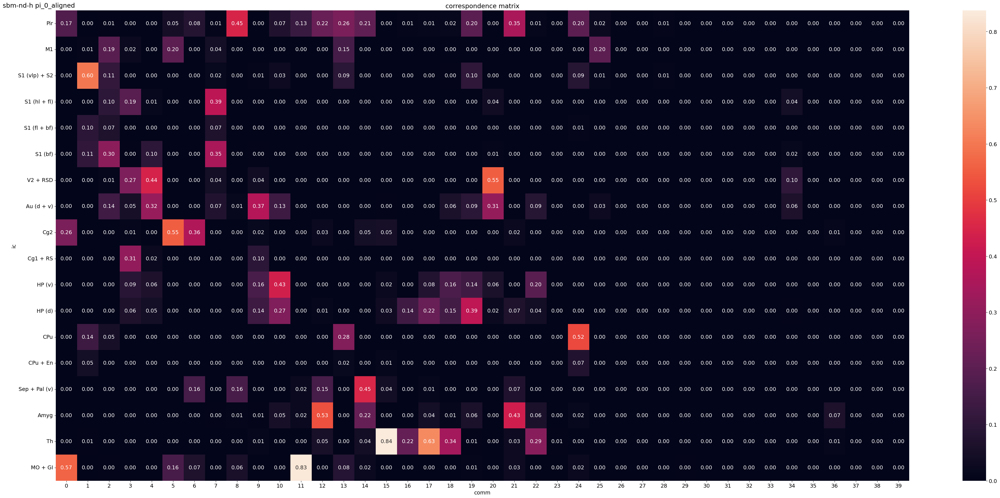

In [48]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
Xs = get_membership_matrix(num_sys, soft_correspondence_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
mean_X = np.mean(Xs, axis=1)
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

correspondence with L-ICs

In [49]:
sys_name = 'lic'
sys_vols = lic_vols
num_sys = sys_vols.shape[-1]
measure = 'correspondence'
sys_df = l_ics_df

In [ ]:
l_correspondence_df = get_estim_df(marginals_vol_df, sys_vols, measure)
l_soft_correspondence_df = get_soft_estim_df(l_correspondence_df, num_sys)
save_individual_estimates(l_correspondence_df, sys_name, measure)

/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2321837/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars


In [ ]:
for idx, row in tqdm(l_soft_correspondence_df.iterrows()):
    sub = row['sub']
    folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
    os.system(f'mkdir -p {folder}')

    for col in cols:
        X = row[col]
        n_comms = X.shape[-1]

        ncols = 1
        nrows = 1
        fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
        fig.tight_layout(h_pad=3, w_pad=3)
        fig.suptitle(f'{SBM} {col} {sub}', x=0.0, y=1.0)
        ax = axs
        
        sns.heatmap(X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
        ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

        fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')

    plt.close('all')

9it [00:31,  3.50s/it]


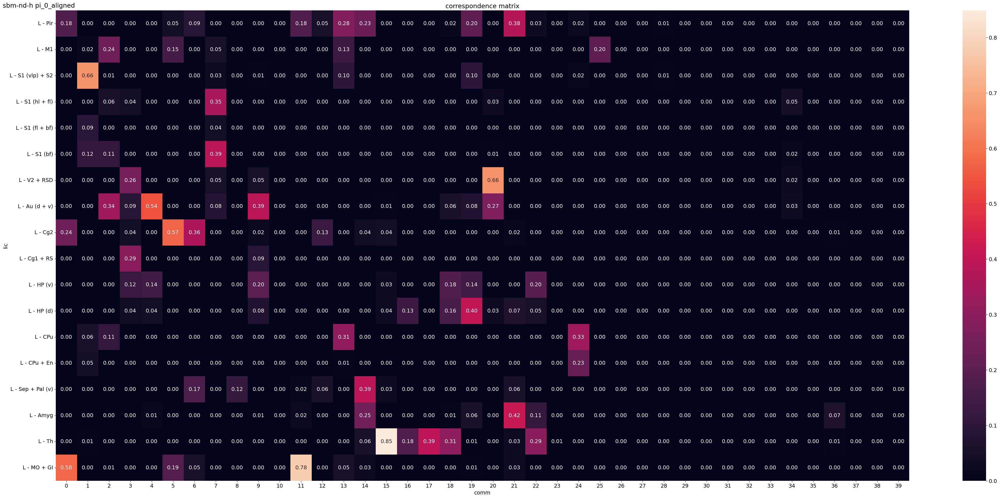

In [ ]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
Xs = get_membership_matrix(num_sys, l_soft_correspondence_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
mean_X = np.mean(Xs, axis=1)
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

correspondence with R ICs

In [ ]:
sys_name = 'ric'
sys_vols = ric_vols
num_sys = sys_vols.shape[-1]
measure = 'correspondence'
sys_df = r_ics_df

In [ ]:
r_correspondence_df = get_estim_df(marginals_vol_df, sys_vols, measure)
r_soft_correspondence_df = get_soft_estim_df(r_correspondence_df, num_sys)
save_individual_estimates(r_correspondence_df, sys_name, measure)

/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars


/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:4: RuntimeWarning: invalid value encountered in float_scalars
/tmp/ipykernel_2315668/1395378944.py:4: RuntimeWarning: invalid value encountered in float_scalars
/tmp/ipykernel_2315668/1395378944.py:4: RuntimeWarning: invalid value encountered in float_scalars
/tmp/ipykernel_2315668/1395378944.py:4: RuntimeWarning: invalid value encountered in float_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp/ipykernel_2315668/1395378944.py:6: RuntimeWarning: invalid value encountered in double_scalars
/tmp

In [ ]:
for idx, row in tqdm(r_soft_correspondence_df.iterrows()):
    sub = row['sub']
    folder = f'{ESTIM_path}/individual/sub-{sub}/resemblance-with-known-systems/{SBM}'
    os.system(f'mkdir -p {folder}')

    for col in cols:
        X = row[col]
        n_comms = X.shape[-1]

        ncols = 1
        nrows = 1
        fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
        fig.tight_layout(h_pad=3, w_pad=3)
        fig.suptitle(f'{SBM} {col} {sub}', x=0.0, y=1.0)
        ax = axs
        
        sns.heatmap(X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
        ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

        fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')

    plt.close('all')

9it [00:32,  3.61s/it]


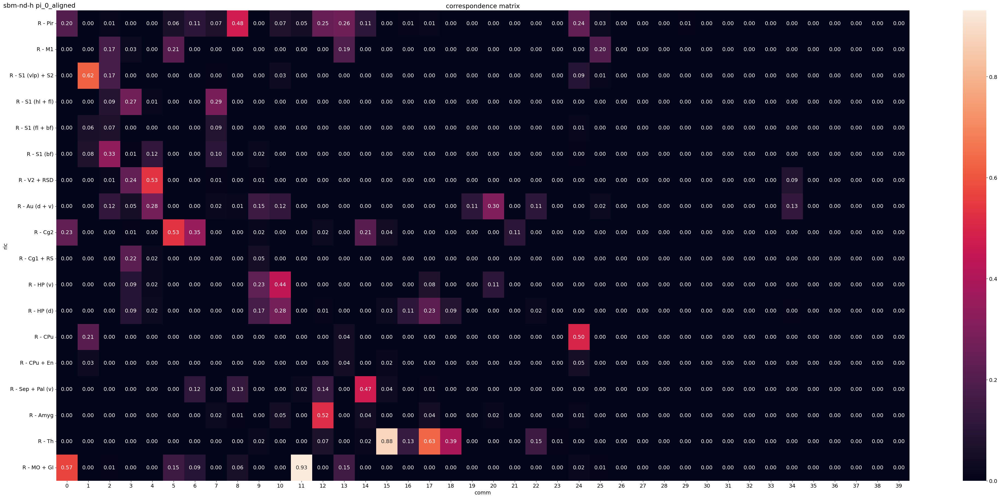

In [ ]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
Xs = get_membership_matrix(num_sys, r_soft_correspondence_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
mean_X = np.mean(Xs, axis=1)
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

In [ ]:
# combining results from all hemispheres

In [ ]:
Xs = get_membership_matrix(num_sys, soft_correspondence_df, col=col)
lXs = get_membership_matrix(num_sys, l_soft_correspondence_df, col=col)
rXs = get_membership_matrix(num_sys, r_soft_correspondence_df, col=col)
all_Xs = np.stack([Xs, lXs, rXs], axis=-1)
all_Xs.shape

(18, 9, 40, 3)

In [ ]:
sys_name = f'cic' # combined ic

In [ ]:
max_Xs = np.max(all_Xs, axis=-1)
mean_max_X = np.mean(max_Xs, axis=1)
mean_max_X = np.ma.masked_less_equal(mean_max_X, 0.1)
argmax_Xs = np.argmax(all_Xs, axis=-1) + 1
argmax_mean_X = np.mean(argmax_Xs, axis=1)
argmax_mean_X *= (1 - mean_max_X.mask)

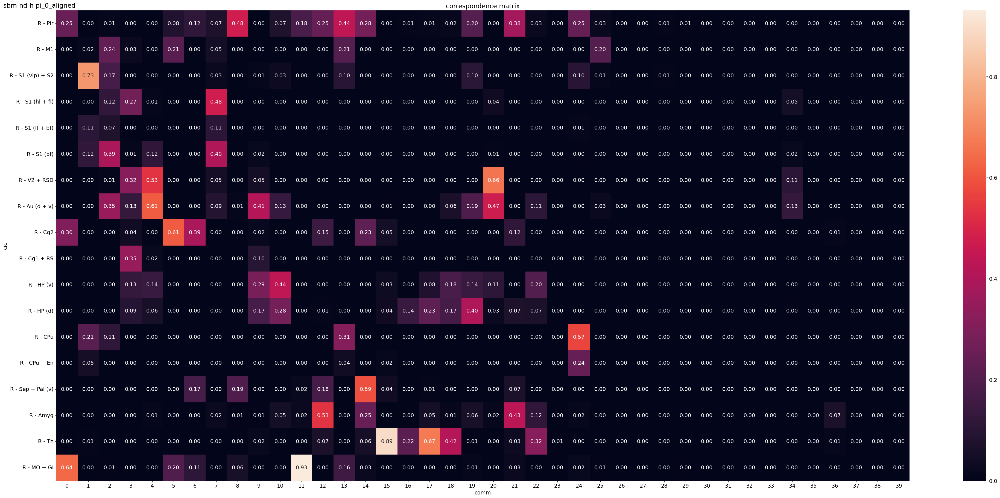

In [ ]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
# Xs = get_membership_matrix(num_sys, r_soft_correspondence_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
# mean_X = np.mean(max_Xs.mask, axis=1)
mean_X = mean_max_X
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

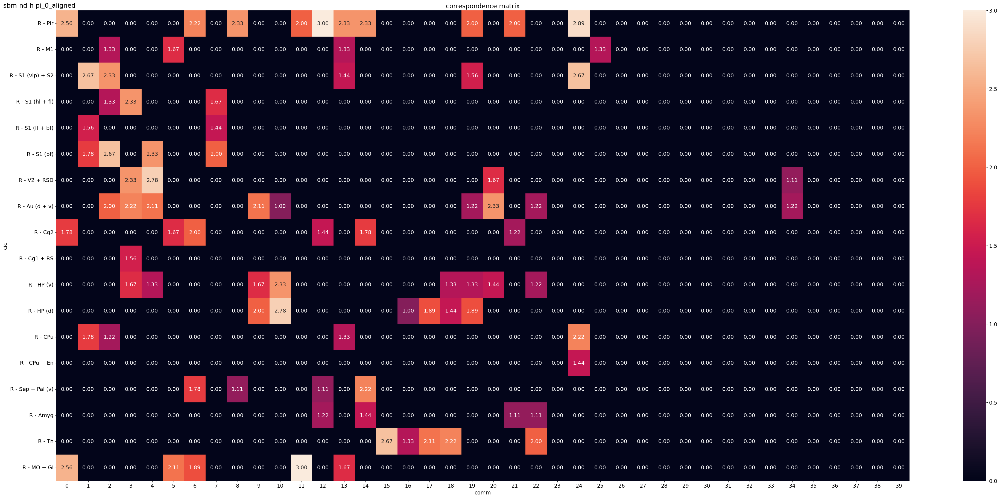

In [ ]:
folder = f'{ESTIM_path}/group/resemblance-with-known-systems/{SBM}'
os.system(f'mkdir -p {folder}')

col = cols[0]
# Xs = get_membership_matrix(num_sys, r_soft_correspondence_df, col=col)
n_comms = Xs.shape[-1]

ncols = 1
nrows = 1
fig, axs = plt.subplots(nrows, ncols, figsize=(n_comms*ncols, num_sys*nrows),)
fig.tight_layout(h_pad=3, w_pad=3)
fig.suptitle(f'{SBM} {col}', x=0.0, y=1.0)
ax = axs
# mean_X = np.mean(argmax_Xs, axis=1)
mean_X = argmax_mean_X
sns.heatmap(mean_X, ax=ax, annot=True, fmt='.2f', yticklabels=sys_df['name'].to_list())
ax.set(xlabel=f'comm', ylabel=f'{sys_name}', title=f'{measure} matrix')

fig.savefig(f'{folder}/col-{col}_sys-{sys_name}_desc-{measure}-matrix.pdf', bbox_inches='tight')
# plt.close('all')

---
---

---

resemblance with known systems